Text(0, 0.5, 'Usc2')

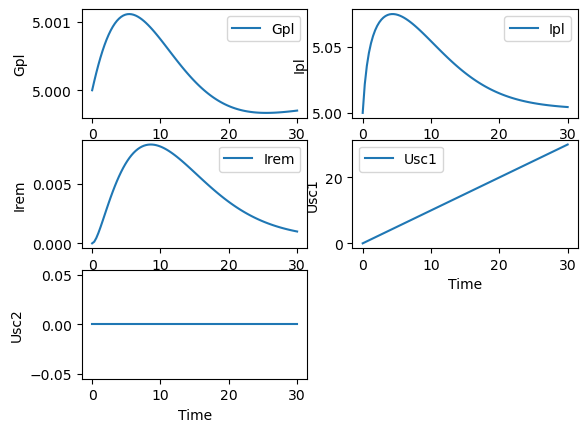

In [3]:
import numpy as np
from scipy.integrate import solve_ivp
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from scipy.integrate import quad
from mpl_toolkits.mplot3d import Axes3D

variables = {
    'k1': 0.094,
    'k2': 0.0094,
    'k3': 0.12,
    'k4': 2.35e-4,
    'k5': 9.49e-2,
    'k6': 1.93e-1,
    'k7': 1.15,
    'k8': 7.27,
    'k9': 0,
    'k10': 0,
    'k11': 3.83e-2,
    'k12': 2.84e-1,
    'k13': 0,
    'sigma': 1.8,
    'K_M': 13.2,
    'Gbpl': 5,
    'Ibpl': 5,
    'gbliv': 0.043,
    'Gthpl': 9,
    'vG': 17 / 70,
    'vI': 13 / 70,
    'beta': 1,
    'f': 0.005551,
    'tau_i': 31,
    't_start': 0,
    't_end': 30,
    't_start_ipnc': 0,
    't_end_ipnc': 15,
    'tau_d': 3,
    'c1': 0.1,
    'h': 1,
    't_half': 1,
    'a': 1,
    'b': 1
}

inputs = {
    'Dmeal': 136,
    'Mb': 66,
    'usa': lambda t: 1,
    'Ula': lambda t: 1,
    'h': 2
}


def MGgut(t):
    D_meal = inputs['Dmeal']
    k1 = variables['k1']
    sigma = variables['sigma']
    return D_meal * np.exp(-(k1*t)**sigma)

def dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def gliv(Gpl, Irem):
        gbliv = variables['gbliv']
        k3 = variables['k3']
        Gbpl = variables['Gbpl']
        k4 = variables['k4']
        beta = variables['beta'] 
        return gbliv - k3 * (Gpl - Gbpl) - k4 * beta * Irem

    def ggut(MGgut):
        k2 = variables['k2']
        f = variables['f']
        vG = variables['vG']
        Mb = inputs['Mb']
        return k2 * (f / (vG * Mb)) * MGgut

    def gnonit(Gpl):
        gbliv = variables['gbliv']
        KM = variables['K_M']
        Gbpl = variables['Gbpl']
        return gbliv * ((KM + Gbpl) / Gbpl) * (Gpl / (KM + Gpl))

    def git(Gpl, Irem):
        k5 = variables['k5']
        beta = variables['beta']
        KM = variables['K_M']
        return k5 * beta * Irem * (Gpl / (KM + Gpl))

    def gren(Gpl):
        c1 = variables['c1']
        vG = variables['vG']
        Mb = inputs['Mb']
        Gthpl = variables['Gthpl']
        return 0 if Gpl < Gthpl else (c1 / (vG * Mb)) * (Gpl - Gthpl)

    return gliv(Gpl, Irem) + ggut(MGgut(t)) - gnonit(Gpl) - git(Gpl, Irem) - gren(Gpl)

def dUsc1_dt(t, Usc1):
        k10 = variables['k10']
        usa = inputs['usa']
        return usa(t) - k10 * Usc1

def dUsc2_dt(t, Usc1, Usc2):
        k9 = variables['k9']
        k10 = variables['k10']
        return k10 * Usc1 - k9 * Usc2

def dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):

    def ipnc(t, Gpl, dGpl_dt):
        Gbpl = variables['Gbpl']
        beta = variables['beta']
        k6 = variables['k6']
        k7 = variables['k7']
        tau_i = variables['tau_i']
        k8 = variables['k8']
        tau_d = variables['tau_d']
        t_start = variables['t_start']
        t_end = variables['t_end']

        if np.isscalar(dGpl_dt):
            dGpl_dt = np.array([dGpl_dt])  # Convert scalar to array

        def integrand(x):
            return np.squeeze(Gpl - Gbpl)

        integral_term, _ = quad(integrand, t_start, t_end)
        return (1 / beta) * (k6 * np.squeeze(Gpl - Gbpl) + (k7 / tau_i) * integral_term + (k7 / tau_i) * Gbpl + (k8 * tau_d) * dGpl_dt)


    def isa(t, Usc2):
        k9 = variables['k9']
        vI = variables['vI']
        Mb = inputs['Mb']
        return k9 * (1 / (vI * Mb)) * Usc2

    def ila(t, Ula):
        h = variables['h']
        t_half = variables['t_half']
        vI = variables['vI']
        Mb = inputs['Mb']
        return ((h * (t_half ** h) * (t ** (h - 1))) / (((t_half ** h) + (t ** h)) ** 2)) * ((1 / (vI * Mb)) * Ula(t))

    def iliv(t, Gpl, Ipl):
        k7 = variables['k7']
        beta = variables['beta']
        tau_i = variables['tau_i']
        Ibpl = variables['Ibpl']
        return k7 * (variables['Gbpl'] / (beta * tau_i * Ibpl)) * Ipl

    def irem(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    return ipnc(t, Gpl, dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)) + isa(t, Usc2) + ila(t, inputs['Ula']) - iliv(t, Gpl, Ipl) - irem(t, Ipl)



def dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def ipl(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    def iit(t, Irem):
        k12 = variables['k12']
        return k12 * Irem

    return ipl(t, Ipl) - iit(t, Irem)

                                                                              
def system(y, t):
    Gpl, Ipl, Irem, Usc1, Usc2 = y

    # Define the derivatives
    dGpl_dt_val = dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIpl_dt_val = dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIrem_dt_val = dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dUsc1_dt_val = dUsc1_dt(t, Usc1)
    dUsc2_dt_val = dUsc2_dt(t, Usc1, Usc2)

    return [dGpl_dt_val, dIpl_dt_val, dIrem_dt_val, dUsc1_dt_val, dUsc2_dt_val]


# Set the initial conditions
initial_conditions = [5, 5, 0, 0, 0]

# Set the time points for integration
t = np.linspace(0, 30, 100)

# Solve the system of equations
solution = odeint(system, initial_conditions, t)

# Extract the variables from the solution
Gpl = solution[:, 0]
Ipl = solution[:, 1]
Irem = solution[:, 2]
Usc1 = solution[:, 3]
Usc2 = solution[:, 4]

# Plot the results
plt.figure()

plt.subplot(3, 2, 1)
plt.plot(t, Gpl, label='Gpl')
plt.xlabel('Time')
plt.ylabel('Gpl')
plt.legend()

plt.subplot(3, 2, 2)
plt.plot(t, Ipl, label='Ipl')
plt.xlabel('Time')
plt.ylabel('Ipl')
plt.legend()

plt.subplot(3, 2, 3)
plt.plot(t, Irem, label='Irem')
plt.xlabel('Time')
plt.ylabel('Irem')
plt.legend()

plt.subplot(3, 2, 4)
plt.plot(t, Usc1, label='Usc1')
plt.xlabel('Time')
plt.ylabel('Usc1')
plt.legend()

plt.subplot(3, 2, 5)
plt.plot(t, Usc2, label='Usc2')
plt.xlabel('Time')
plt.ylabel('Usc2')

C:\Users\buddy\AppData\Local\Temp\ipykernel_39680\4262928924.py:275: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()  # Adjust the spacing between subplots if needed
C:\Users\buddy\AppData\Local\Temp\ipykernel_39680\4262928924.py:275: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()  # Adjust the spacing between subplots if needed


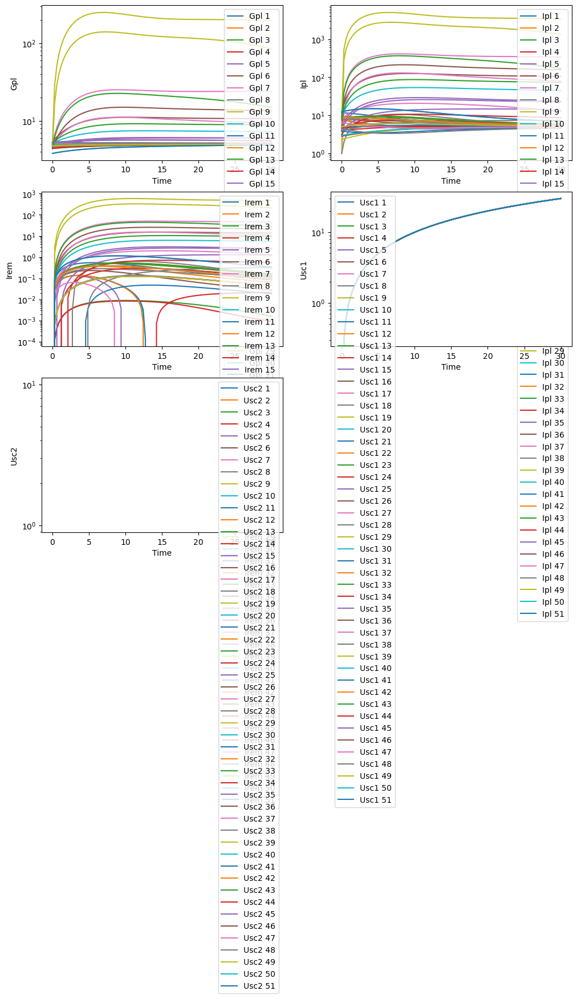

In [11]:
import numpy as np
import pandas as pd
from scipy.integrate import solve_ivp
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from scipy.integrate import quad
from mpl_toolkits.mplot3d import Axes3D

const = pd.read_excel(r'C:\Users\buddy\OneDrive\Desktop\AINutrition\ainutrition\test_data.xlsx')

k1_list = []
k2_list = []
k13_list = []
sigma_list = []
carb_list = []
G0_list = []
I0_list = []


Gpl_results = []
Ipl_results = []
Irem_results = []
Usc1_results = []
Usc2_results = []

for i in range(51):
    k1_list.append(const.iloc[i][2])
    k2_list.append(const.iloc[i][3])
    k13_list.append(const.iloc[i][4])
    sigma_list.append(const.iloc[i][5])
    carb_list.append(const.iloc[i][6])
    G0_list.append(const.iloc[i][7])
    I0_list.append(const.iloc[i][8])


def MGgut(t):
    D_meal = inputs['Dmeal']
    k1 = variables['k1']
    sigma = variables['sigma']
    return D_meal * np.exp(-(k1*t)**sigma)

def dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def gliv(Gpl, Irem):
        gbliv = variables['gbliv']
        k3 = variables['k3']
        Gbpl = variables['Gbpl']
        k4 = variables['k4']
        beta = variables['beta'] 
        return gbliv - k3 * (Gpl - Gbpl) - k4 * beta * Irem

    def ggut(MGgut):
        k2 = variables['k2']
        f = variables['f']
        vG = variables['vG']
        Mb = inputs['Mb']
        return k2 * (f / (vG * Mb)) * MGgut

    def gnonit(Gpl):
        gbliv = variables['gbliv']
        KM = variables['K_M']
        Gbpl = variables['Gbpl']
        return gbliv * ((KM + Gbpl) / Gbpl) * (Gpl / (KM + Gpl))

    def git(Gpl, Irem):
        k5 = variables['k5']
        beta = variables['beta']
        KM = variables['K_M']
        return k5 * beta * Irem * (Gpl / (KM + Gpl))

    def gren(Gpl):
        c1 = variables['c1']
        vG = variables['vG']
        Mb = inputs['Mb']
        Gthpl = variables['Gthpl']
        return 0 if Gpl < Gthpl else (c1 / (vG * Mb)) * (Gpl - Gthpl)

    return gliv(Gpl, Irem) + ggut(MGgut(t)) - gnonit(Gpl) - git(Gpl, Irem) - gren(Gpl)

def dUsc1_dt(t, Usc1):
        k10 = variables['k10']
        usa = inputs['usa']
        return usa(t) - k10 * Usc1

def dUsc2_dt(t, Usc1, Usc2):
        k9 = variables['k9']
        k10 = variables['k10']
        return k10 * Usc1 - k9 * Usc2

def dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):

    def ipnc(t, Gpl, dGpl_dt):
        Gbpl = variables['Gbpl']
        beta = variables['beta']
        k6 = variables['k6']
        k7 = variables['k7']
        tau_i = variables['tau_i']
        k8 = variables['k8']
        tau_d = variables['tau_d']
        t_start = variables['t_start']
        t_end = variables['t_end']

        if np.isscalar(dGpl_dt):
            dGpl_dt = np.array([dGpl_dt])  # Convert scalar to array

        def integrand(x):
            return np.squeeze(Gpl - Gbpl)

        integral_term, _ = quad(integrand, t_start, t_end)
        return (1 / beta) * (k6 * np.squeeze(Gpl - Gbpl) + (k7 / tau_i) * integral_term + (k7 / tau_i) * Gbpl + (k8 * tau_d) * dGpl_dt)


    def isa(t, Usc2):
        k9 = variables['k9']
        vI = variables['vI']
        Mb = inputs['Mb']
        return k9 * (1 / (vI * Mb)) * Usc2

    def ila(t, Ula):
        h = variables['h']
        t_half = variables['t_half']
        vI = variables['vI']
        Mb = inputs['Mb']
        return ((h * (t_half ** h) * (t ** (h - 1))) / (((t_half ** h) + (t ** h)) ** 2)) * ((1 / (vI * Mb)) * Ula(t))

    def iliv(t, Gpl, Ipl):
        k7 = variables['k7']
        beta = variables['beta']
        tau_i = variables['tau_i']
        Ibpl = variables['Ibpl']
        return k7 * (variables['Gbpl'] / (beta * tau_i * Ibpl)) * Ipl

    def irem(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    return ipnc(t, Gpl, dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)) + isa(t, Usc2) + ila(t, inputs['Ula']) - iliv(t, Gpl, Ipl) - irem(t, Ipl)



def dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def ipl(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    def iit(t, Irem):
        k12 = variables['k12']
        return k12 * Irem

    return ipl(t, Ipl) - iit(t, Irem)

                                                                              
def system(y, t):
    Gpl, Ipl, Irem, Usc1, Usc2 = y

    # Define the derivatives
    dGpl_dt_val = dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIpl_dt_val = dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIrem_dt_val = dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dUsc1_dt_val = dUsc1_dt(t, Usc1)
    dUsc2_dt_val = dUsc2_dt(t, Usc1, Usc2)

    return [dGpl_dt_val, dIpl_dt_val, dIrem_dt_val, dUsc1_dt_val, dUsc2_dt_val]

for i in range(51):
    variables = {
        'k1': k1_list[i],
        'k2': k2_list[i],
        'k3': 0.13,
        'k4': 2.35e-4,
        'k5': 9.49e-2,
        'k6': 1.93e-1,
        'k7': 1.15,
        'k8': 7.27,
        'k9': 0,
        'k10': 0,
        'k11': 3.83e-2,
        'k12': 2.84e-1,
        'k13': k13_list[i],
        'sigma': sigma_list[i],
        'K_M': 13.2,
        'Gbpl': 5,
        'Ibpl': 5,
        'gbliv': 0.043,
        'Gthpl': 9,
        'vG': 17 / 70,
        'vI': 13 / 70,
        'beta': 1,
        'f': 0.005551,
        'tau_i': 31,
        't_start': 0,
        't_end': 30,
        't_start_ipnc': 0,
        't_end_ipnc': 15,
        'tau_d': 3,
        'c1': 0.1,
        'h': 1,
        't_half': 1,
        'a': 1,
        'b': 1
    }

    inputs = {
        'Dmeal': carb_list[i],
        'Mb': 66,
        'usa': lambda t: 1,
        'Ula': lambda t: 1,
        'h': 2
    }


    # Set the initial conditions
    initial_conditions = [G0_list[i], I0_list[i], 0, 0, 0]

    # Set the time points for integration
    t = np.linspace(0, 30, 100)

    # Solve the system of equations
    solution = odeint(system, initial_conditions, t)

    # Extract the variables from the solution
    Gpl_results.append(solution[:, 0])
    Ipl_results.append(solution[:, 1])
    Irem_results.append(solution[:, 2])
    Usc1_results.append(solution[:, 3])
    Usc2_results.append(solution[:, 4])

plt.figure(figsize=(12, 12))  # Adjust the figure size as needed

# Plot Gpl
plt.subplot(3, 2, 1)
plt.yscale('log')
for i in range(51):
    plt.plot(t, Gpl_results[i], label='Gpl {}'.format(i+1))
plt.xlabel('Time')
plt.ylabel('Gpl')
plt.legend()

# Plot Ipl
plt.subplot(3, 2, 2)
plt.yscale('log')
for i in range(51):
    plt.plot(t, Ipl_results[i], label='Ipl {}'.format(i+1))
plt.xlabel('Time')
plt.ylabel('Ipl')
plt.legend()

# Plot Irem
plt.subplot(3, 2, 3)
plt.yscale('log')
for i in range(51):
    plt.plot(t, Irem_results[i], label='Irem {}'.format(i+1))
plt.xlabel('Time')
plt.ylabel('Irem')
plt.legend()

# Plot Usc1
plt.subplot(3, 2, 4)
plt.yscale('log')
for i in range(51):
    plt.plot(t, Usc1_results[i], label='Usc1 {}'.format(i+1))
plt.xlabel('Time')
plt.ylabel('Usc1')
plt.legend()

# Plot Usc2
plt.subplot(3, 2, 5)
plt.yscale('log')
for i in range(51):
    plt.plot(t, Usc2_results[i], label='Usc2 {}'.format(i+1))
plt.xlabel('Time')
plt.ylabel('Usc2')
plt.legend()

plt.tight_layout()  # Adjust the spacing between subplots if needed
plt.show()


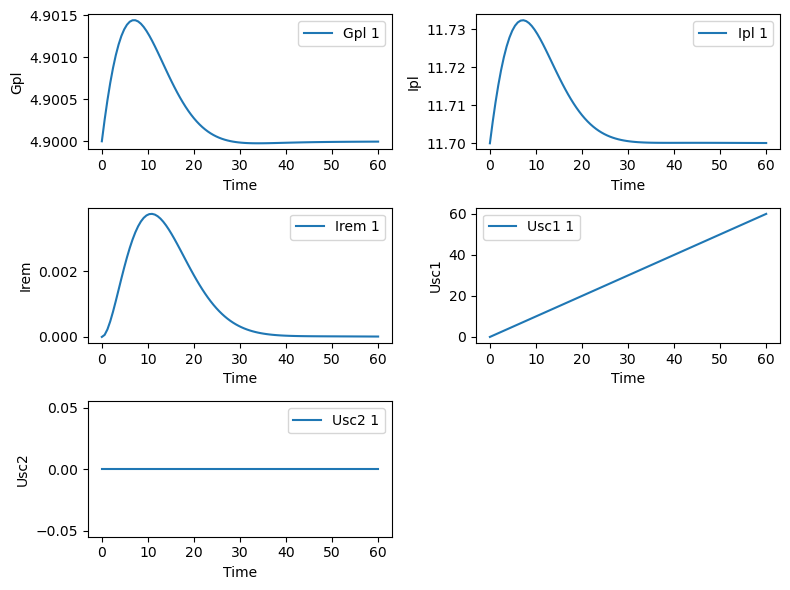

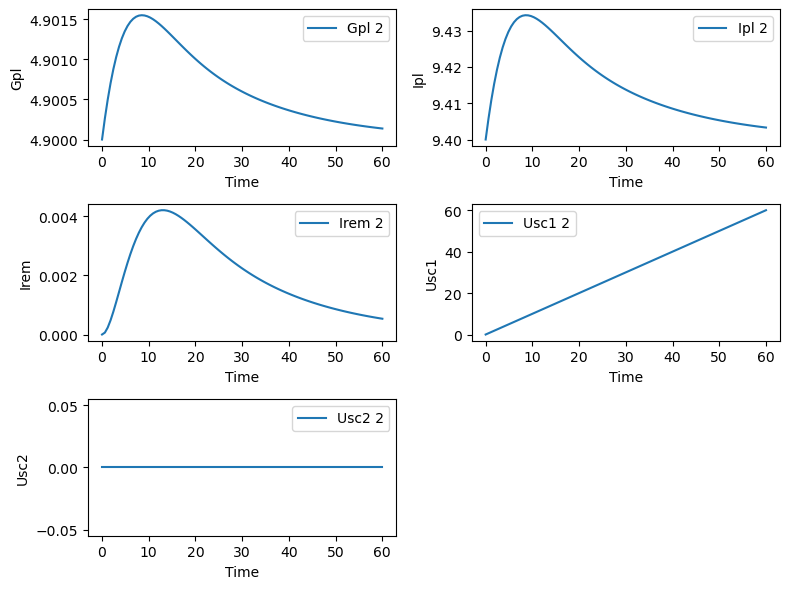

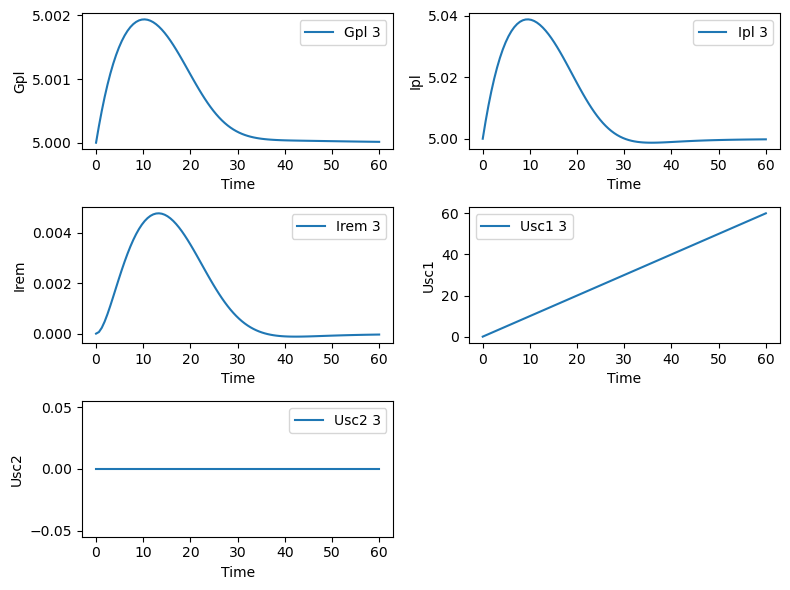

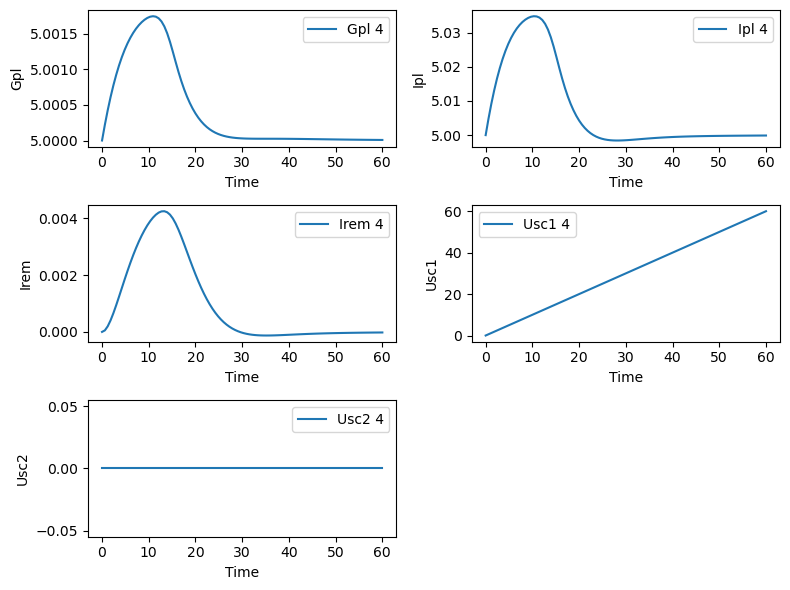

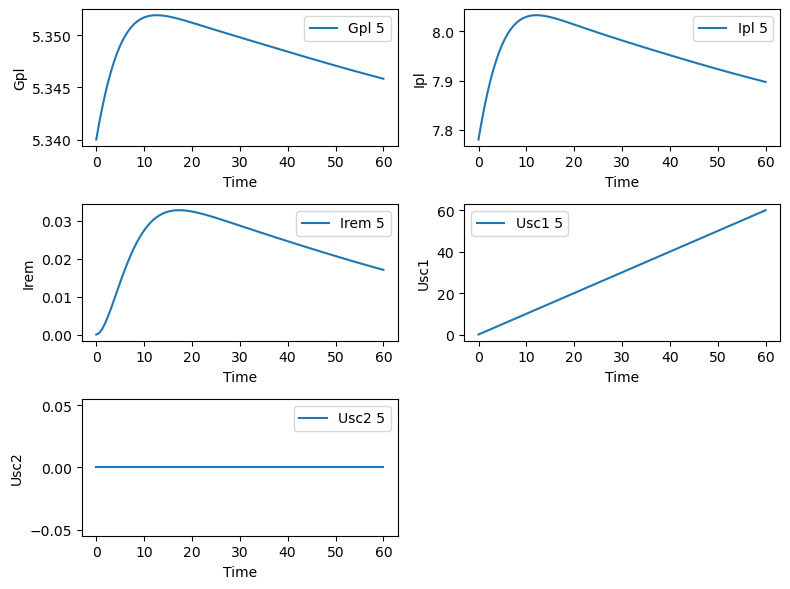

...

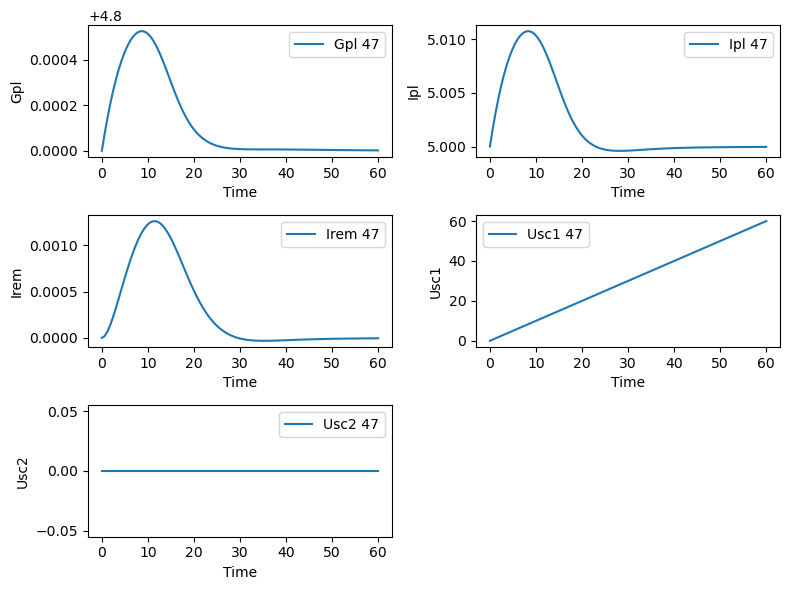

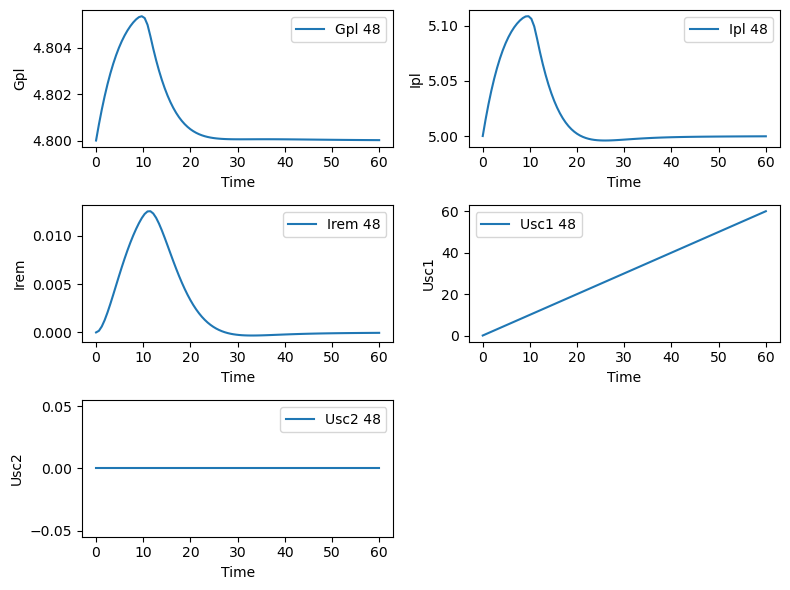

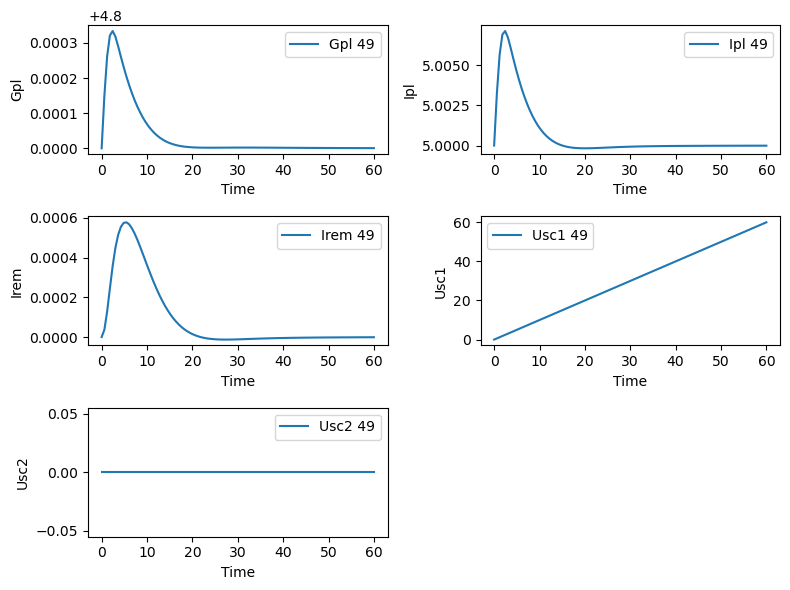

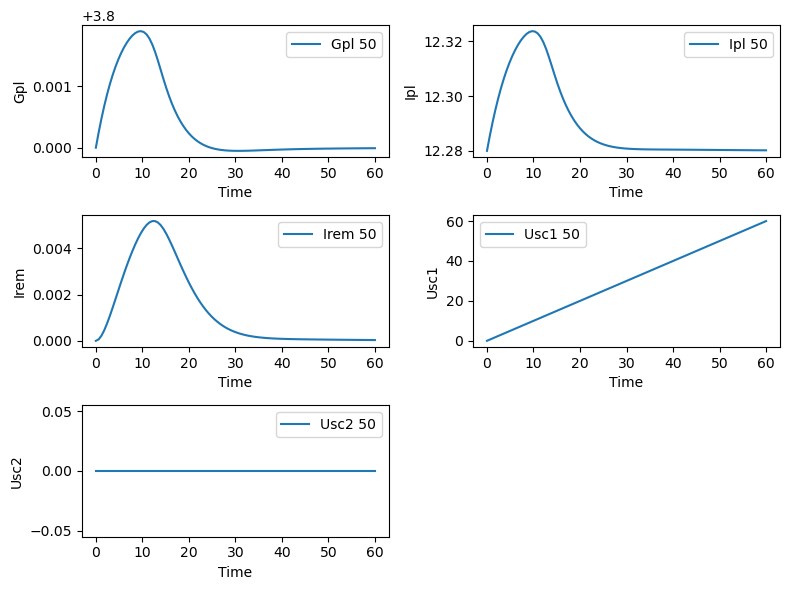

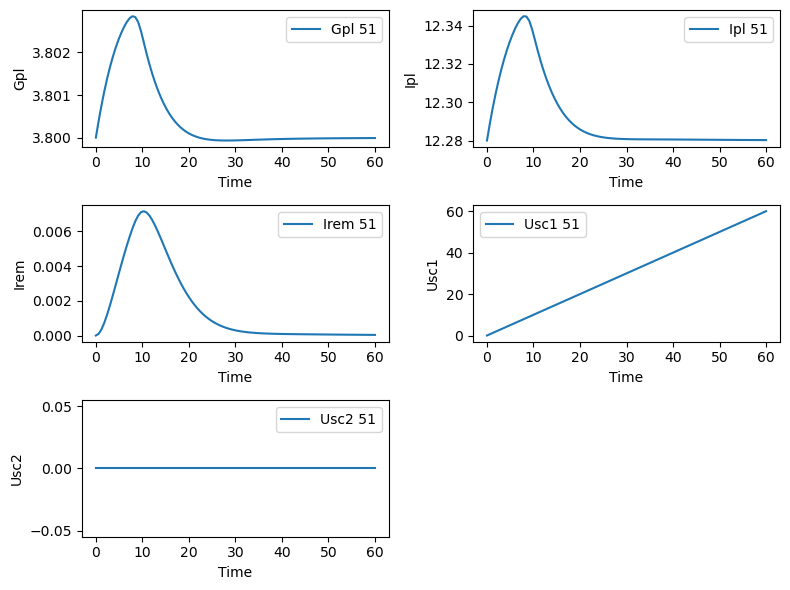

In [11]:
import numpy as np
import pandas as pd
from scipy.integrate import solve_ivp
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from scipy.integrate import quad
from mpl_toolkits.mplot3d import Axes3D

#Adjust as necessary, change to a path that draws from the repository or your computer 
const = pd.read_excel(r'C:\Users\buddy\OneDrive\Desktop\AINutrition\ainutrition\test_data.xlsx')

k1_list = []
k2_list = []
k13_list = []
sigma_list = []
carb_list = []
G0_list = []
I0_list = []

Gpl_results = []
Ipl_results = []
Irem_results = []
Usc1_results = []
Usc2_results = []

#Creates lists for all of the variables that change with each study
for i in range(51):
    k1_list.append(const.iloc[i][2])
    k2_list.append(const.iloc[i][3])
    k13_list.append(const.iloc[i][4])
    sigma_list.append(const.iloc[i][5])
    carb_list.append(const.iloc[i][6])
    G0_list.append(const.iloc[i][7])
    I0_list.append(const.iloc[i][8])

# Taken from init_model/basic_model.ipynb on github, should be replacable with same structure seen in
# following functions (Main function represents diff eq. while related sub-functions define corresponding variables)
def MGgut(t):
    D_meal = inputs['Dmeal']
    k1 = variables['k1']
    sigma = variables['sigma']
    return D_meal * np.exp(-(k1*t)**sigma)

#Main function representing diff eq.: dGpl/dt
def dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    #Function for gliv
    #All differential equations follow this same pattern
    def gliv(Gpl, Irem):
        gbliv = variables['gbliv']
        k3 = variables['k3']
        Gbpl = variables['Gbpl']
        k4 = variables['k4']
        beta = variables['beta'] 
        return gbliv - k3 * (Gpl - Gbpl) - k4 * beta * Irem

    def ggut(MGgut):
        k2 = variables['k2']
        f = variables['f']
        vG = variables['vG']
        Mb = inputs['Mb']
        return k2 * (f / (vG * Mb)) * MGgut

    def gnonit(Gpl):
        gbliv = variables['gbliv']
        KM = variables['K_M']
        Gbpl = variables['Gbpl']
        return gbliv * ((KM + Gbpl) / Gbpl) * (Gpl / (KM + Gpl))

    def git(Gpl, Irem):
        k5 = variables['k5']
        beta = variables['beta']
        KM = variables['K_M']
        return k5 * beta * Irem * (Gpl / (KM + Gpl))

    def gren(Gpl):
        c1 = variables['c1']
        vG = variables['vG']
        Mb = inputs['Mb']
        Gthpl = variables['Gthpl']
        return 0 if Gpl < Gthpl else (c1 / (vG * Mb)) * (Gpl - Gthpl)

    return gliv(Gpl, Irem) + ggut(MGgut(t)) - gnonit(Gpl) - git(Gpl, Irem) - gren(Gpl)

def dUsc1_dt(t, Usc1):
        k10 = variables['k10']
        usa = inputs['usa']
        return usa(t) - k10 * Usc1

def dUsc2_dt(t, Usc1, Usc2):
        k9 = variables['k9']
        k10 = variables['k10']
        return k10 * Usc1 - k9 * Usc2

def dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):

    def ipnc(t, Gpl, dGpl_dt):
        Gbpl = variables['Gbpl']
        beta = variables['beta']
        k6 = variables['k6']
        k7 = variables['k7']
        tau_i = variables['tau_i']
        k8 = variables['k8']
        tau_d = variables['tau_d']
        t_start = variables['t_start']
        t_end = variables['t_end']

        if np.isscalar(dGpl_dt):
            dGpl_dt = np.array([dGpl_dt])  # Convert scalar to array

        def integrand(x):
            return np.squeeze(Gpl - Gbpl)

        integral_term, _ = quad(integrand, t_start, t_end)
        return (1 / beta) * (k6 * np.squeeze(Gpl - Gbpl) + (k7 / tau_i) * integral_term + (k7 / tau_i) * Gbpl + (k8 * tau_d) * dGpl_dt)


    def isa(t, Usc2):
        k9 = variables['k9']
        vI = variables['vI']
        Mb = inputs['Mb']
        return k9 * (1 / (vI * Mb)) * Usc2

    def ila(t, Ula):
        h = variables['h']
        t_half = variables['t_half']
        vI = variables['vI']
        Mb = inputs['Mb']
        return ((h * (t_half ** h) * (t ** (h - 1))) / (((t_half ** h) + (t ** h)) ** 2)) * ((1 / (vI * Mb)) * Ula(t))

    def iliv(t, Gpl, Ipl):
        k7 = variables['k7']
        beta = variables['beta']
        tau_i = variables['tau_i']
        Ibpl = variables['Ibpl']
        return k7 * (variables['Gbpl'] / (beta * tau_i * Ibpl)) * Ipl

    def irem(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    return ipnc(t, Gpl, dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)) + isa(t, Usc2) + ila(t, inputs['Ula']) - iliv(t, Gpl, Ipl) - irem(t, Ipl)



def dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def ipl(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    def iit(t, Irem):
        k12 = variables['k12']
        return k12 * Irem

    return ipl(t, Ipl) - iit(t, Irem)

#Creates a system of diff. equations that can be solved by odeint                                                                  
def system(y, t):
    Gpl, Ipl, Irem, Usc1, Usc2 = y

    # Define the derivatives
    dGpl_dt_val = dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIpl_dt_val = dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIrem_dt_val = dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dUsc1_dt_val = dUsc1_dt(t, Usc1)
    dUsc2_dt_val = dUsc2_dt(t, Usc1, Usc2)

    return [dGpl_dt_val, dIpl_dt_val, dIrem_dt_val, dUsc1_dt_val, dUsc2_dt_val]

#Changes variables used by the previously defined functions for each of the 51 studies. Only some are changed per study
for i in range(51):
    variables = {
        'k1': k1_list[i],
        'k2': k2_list[i],
        'k3': 0.13,
        'k4': 2.35e-4,
        'k5': 9.49e-2,
        'k6': 1.93e-1,
        'k7': 1.15,
        'k8': 7.27,
        'k9': 0,
        'k10': 0,
        'k11': 3.83e-2,
        'k12': 2.84e-1,
        'k13': k13_list[i],
        'sigma': sigma_list[i],
        'K_M': 13.2,
        'Gbpl': G0_list[i],
        'Ibpl': I0_list[i],
        'gbliv': 0.043,
        'Gthpl': 9,
        'vG': 17 / 70,
        'vI': 13 / 70,
        'beta': 1,
        'f': 0.005551,
        'tau_i': 31,
        't_start': 0,
        't_end': 30,
        't_start_ipnc': 0,
        't_end_ipnc': 15,
        'tau_d': 3,
        'c1': 0.1,
        'h': 1,
        't_half': 1,
        'a': 1,
        'b': 1
    }

    inputs = {
        'Dmeal': carb_list[i],
        'Mb': 66,
        'usa': lambda t: 1,
        'Ula': lambda t: 0,
        'h': 1
    }


    # Set the initial conditions
    initial_conditions = [G0_list[i], I0_list[i], 0, 0, 0]

    # Set the time points for integration
    t = np.linspace(0, 60, 100)

    # Solve the system of equations
    solution = odeint(system, initial_conditions, t)

    # Extract the variables from the solution
    Gpl_results.append(solution[:, 0])
    Ipl_results.append(solution[:, 1])
    Irem_results.append(solution[:, 2])
    Usc1_results.append(solution[:, 3])
    Usc2_results.append(solution[:, 4])

#Plots results for all 51 sets of study data in the test_data excel file, used to observe shape of graphs
# to see if they line up with the study
for i in range(51):
    plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

    # Plot Gpl
    plt.subplot(3, 2, 1)
    plt.plot(t, Gpl_results[i], label='Gpl {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Gpl')
    plt.legend()

    # Plot Ipl
    plt.subplot(3, 2, 2)
    plt.plot(t, Ipl_results[i], label='Ipl {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Ipl')
    plt.legend()

    # Plot Irem
    plt.subplot(3, 2, 3)
    plt.plot(t, Irem_results[i], label='Irem {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Irem')
    plt.legend()

    # Plot Usc1
    plt.subplot(3, 2, 4)
    plt.plot(t, Usc1_results[i], label='Usc1 {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Usc1')
    plt.legend()

    # Plot Usc2
    plt.subplot(3, 2, 5)
    plt.plot(t, Usc2_results[i], label='Usc2 {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Usc2')
    plt.legend()

    plt.tight_layout()  # Adjust the spacing between subplots if needed
    plt.show()


C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:83: RuntimeWarning: overflow encountered in double_scalars
  return k2 * MGgut
C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:67: RuntimeWarning: invalid value encountered in add
  z_next = y + 16.0 / 135.0 * k1 + 6656.0 / 12825.0 * k3 + 28561.0 / 56430.0 * k4 - 9.0 / 50.0 * k5 + 2.0 / 55.0 * k6
C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:60: RuntimeWarning: invalid value encountered in add
  k2 = h * f(t + 0.25 * h, y + 0.25 * k1, t_values, y_values)
C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:109: RuntimeWarning: invalid value encountered in double_scalars
  return gbliv * ((KM+Gbpl)/Gbpl) * (Gpl/(KM+Gpl))
C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:115: RuntimeWarning: invalid value encountered in double_scalars
  return k5 * beta * Iif * (Gpl/(KM+Gpl))
C:\Users\buddy\AppData\Local\Temp\ipykernel_5576\2705651095.py:61: RuntimeWarning: invalid value 

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

<Figure size 1200x1800 with 0 Axes>

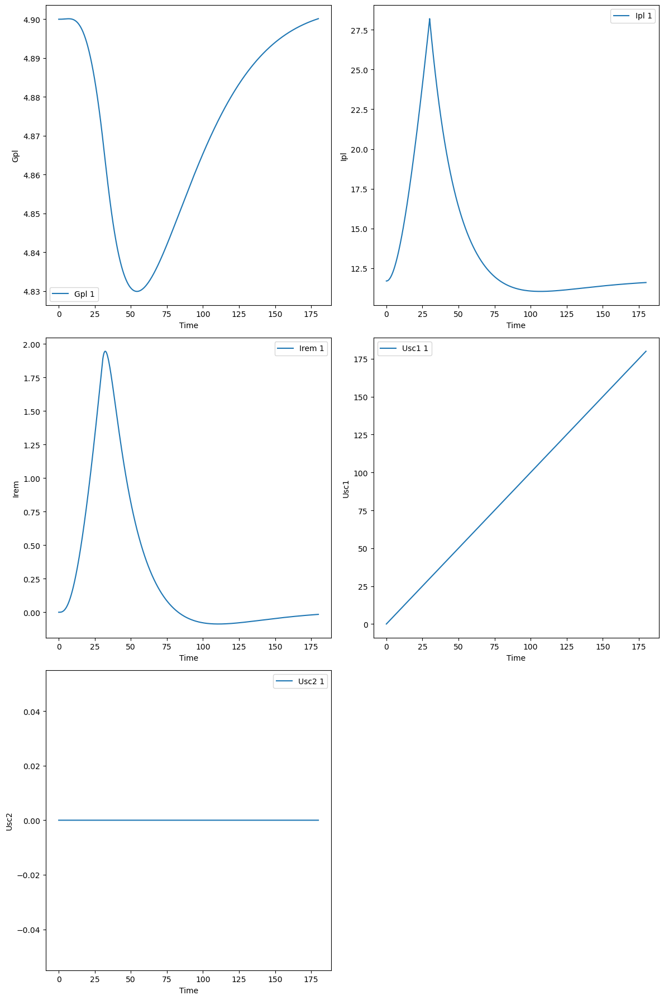

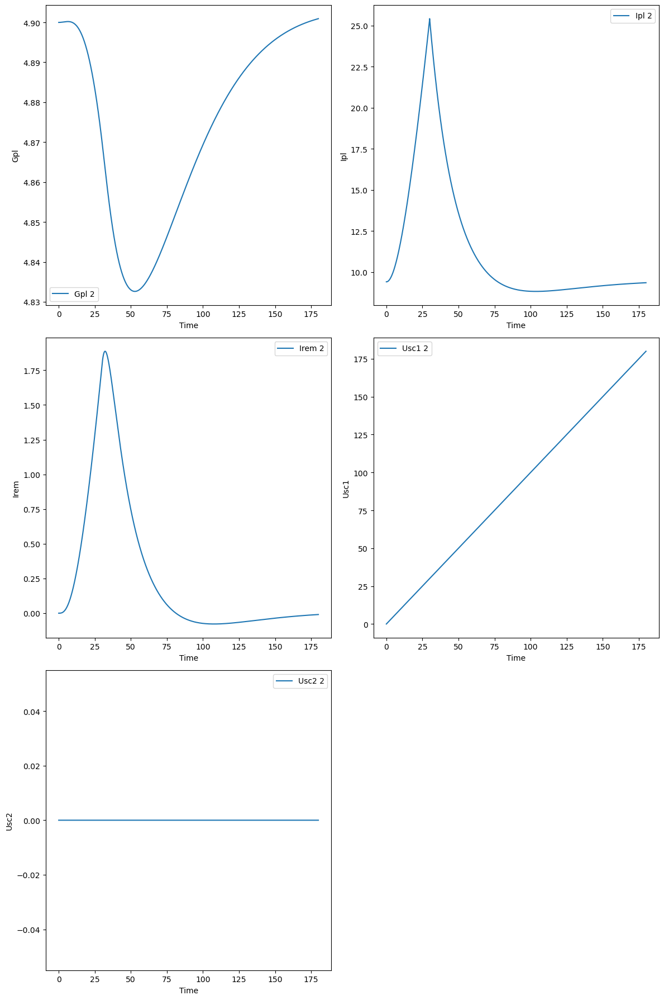

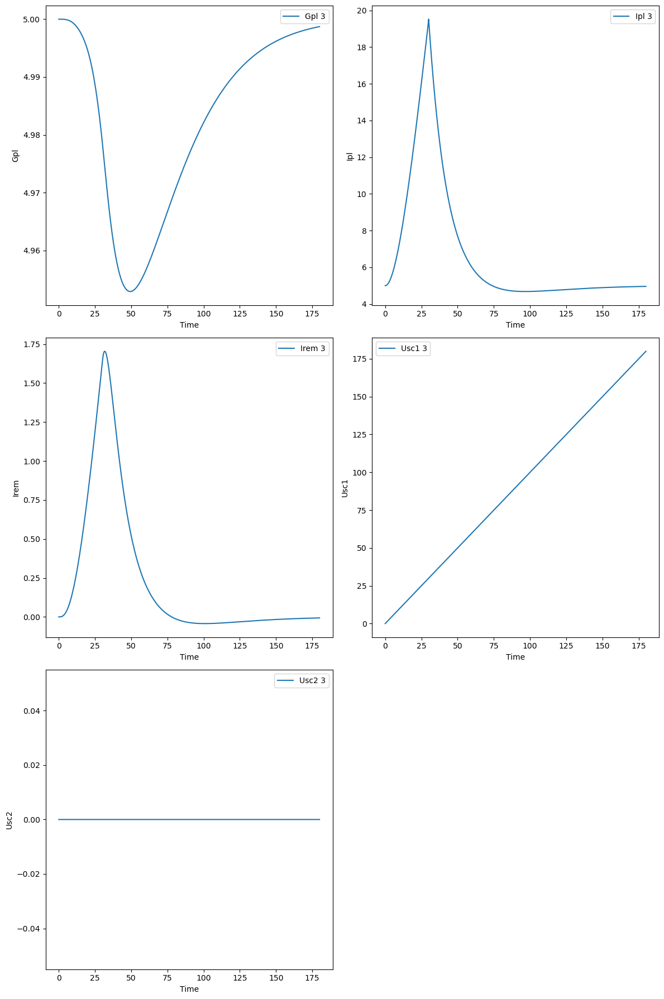

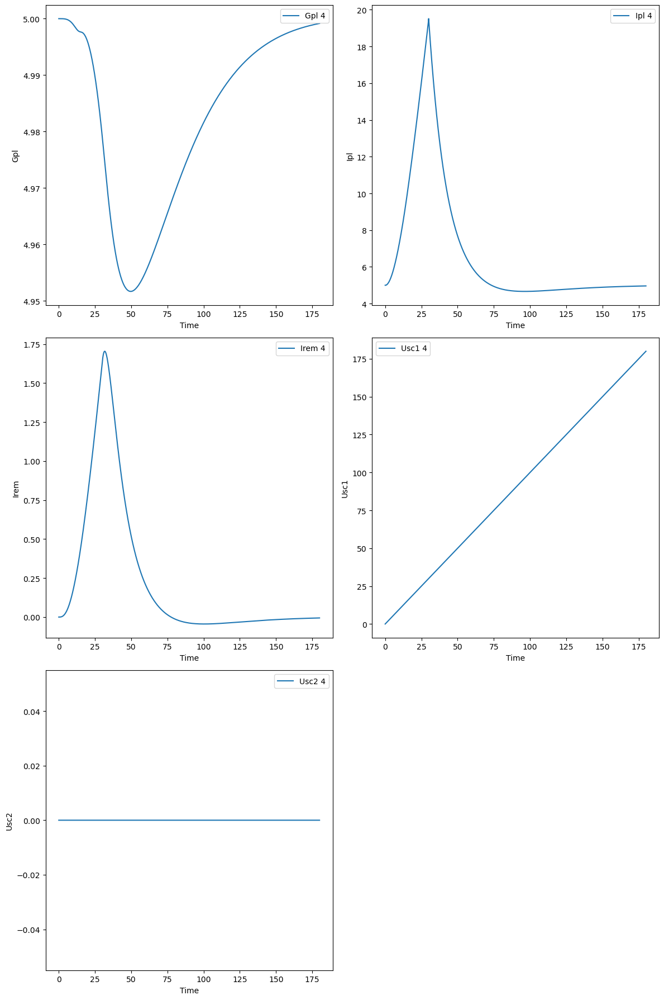

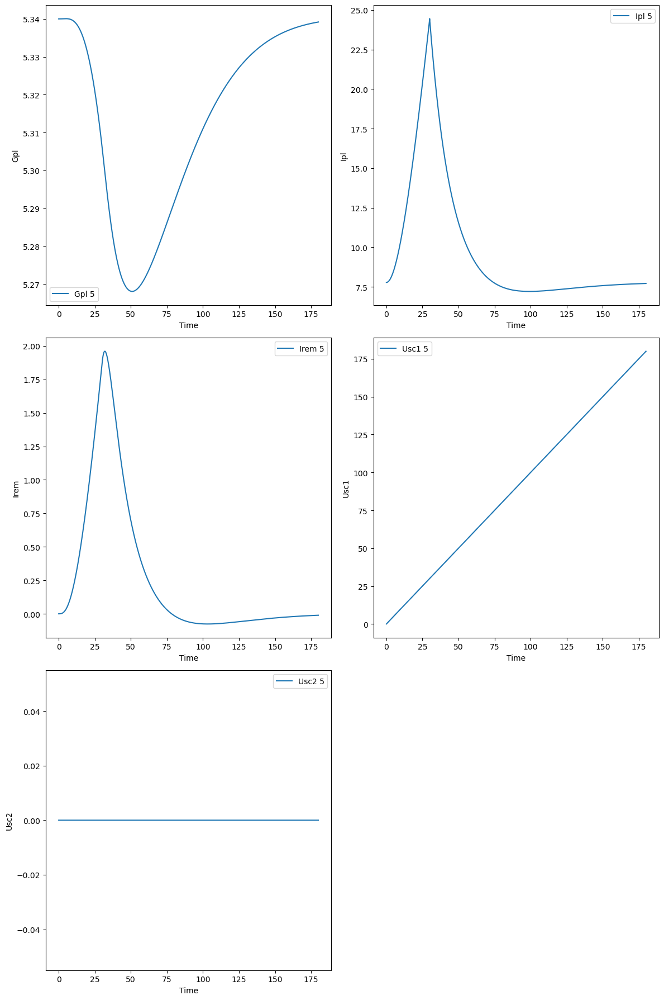

...

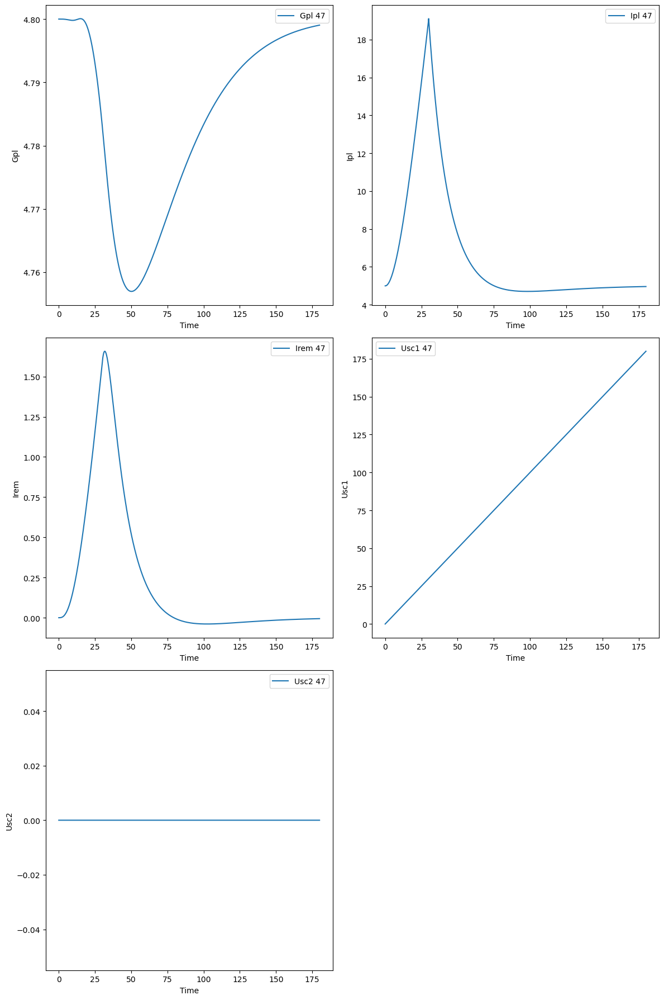

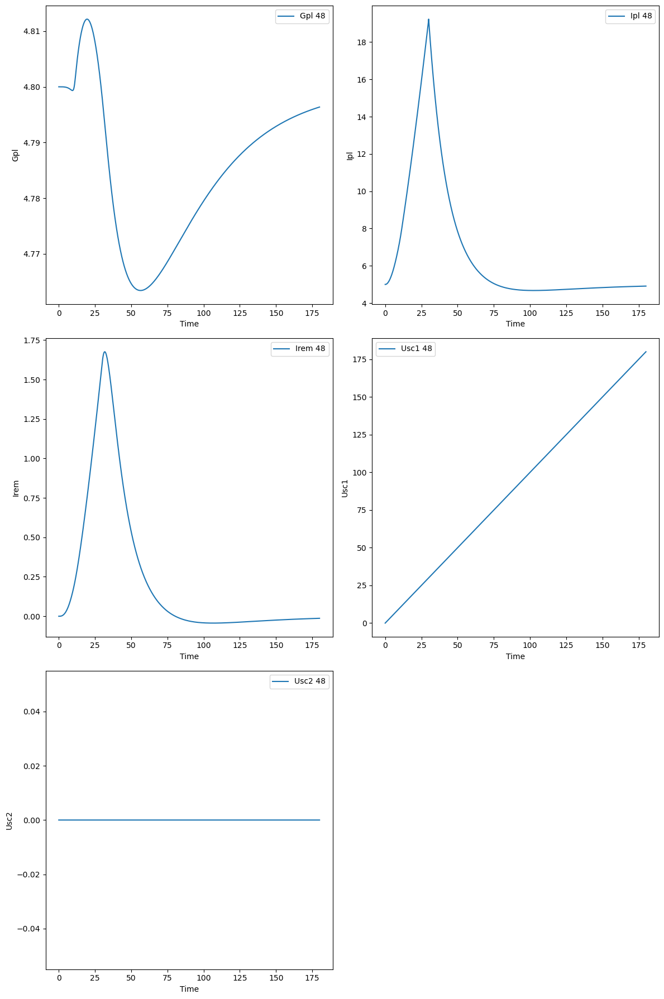

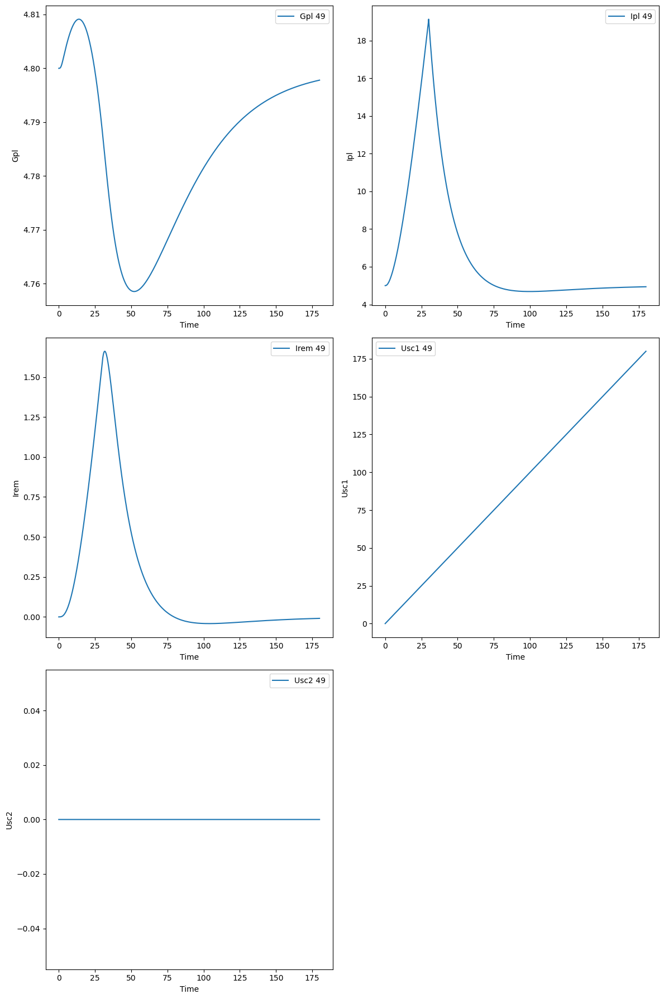

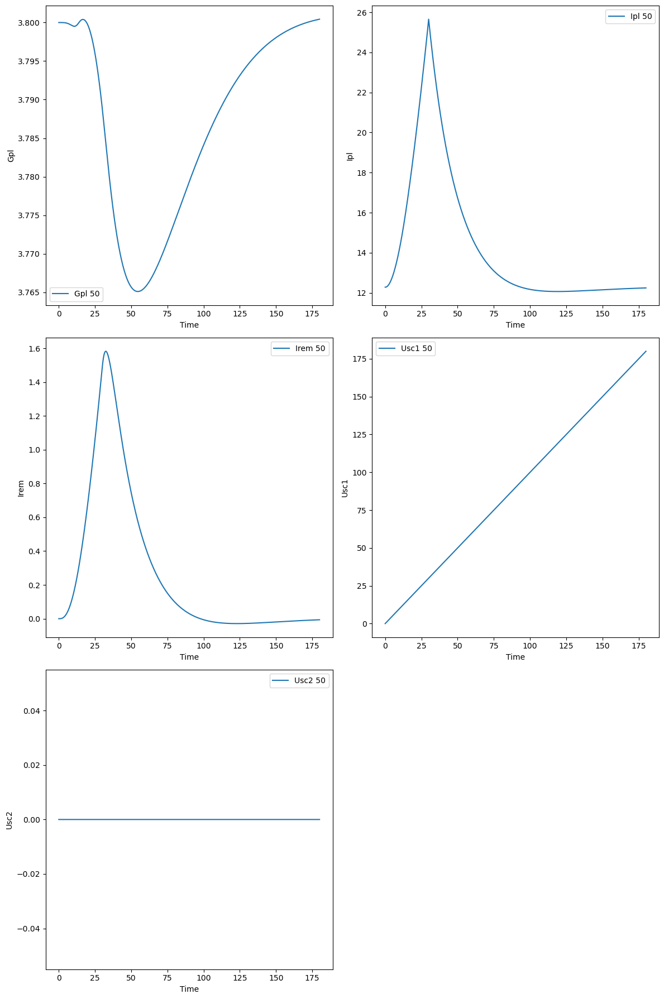

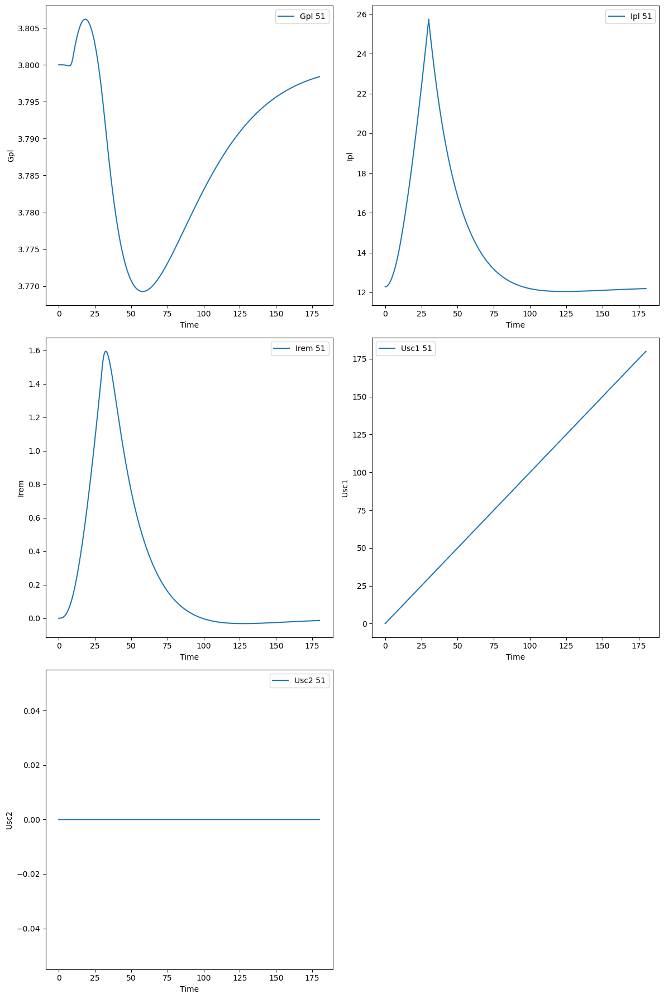

In [4]:
import pandas as pd
import numpy as np
from scipy.integrate import solve_ivp
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from scipy.integrate import quad
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import simpson, solve_ivp

const = pd.read_excel(r'C:\Users\buddy\OneDrive\Desktop\AINutrition\ainutrition\test_data.xlsx')

k1_list = []
k2_list = []
k13_list = []
sigma_list = []
carb_list = []
G0_list = []
I0_list = []

Mg_results = []
Gpl_results = []
Ipl_results = []
Irem_results = []
Usc1_results = []
Usc2_results = []

for i in range(51):
    k1_list.append(const.iloc[i][2])
    k2_list.append(const.iloc[i][3])
    k13_list.append(const.iloc[i][4])
    sigma_list.append(const.iloc[i][5])
    carb_list.append(const.iloc[i][6])
    G0_list.append(const.iloc[i][7])
    I0_list.append(const.iloc[i][8])

def runge_kutta45_bh(f, t0, y0, h, num_steps):
    """
    Runge-Kutta 4/5 method for solving ordinary differential equations (ODEs).

    Parameters:
        f (function): The function defining the ODE dy/dt = f(t, y).
        t0 (float): The initial value of the independent variable.
        y0 (float or array-like): The initial value(s) of the dependent variable(s).
        h (float): The step size.
        num_steps (int): The number of steps to perform.

    Returns:
        tuple: Two NumPy arrays containing the values of the independent variable (t) and the dependent variable (y).
    """
    t_values = np.zeros(num_steps + 1)
    y_values = np.zeros((num_steps + 1, len(y0)))
    t_values[0] = t0
    y_values[0] = y0

    for i in range(num_steps):
        t = t_values[i]
        y = y_values[i]

        k1 = h * f(t, y, t_values, y_values)
        k2 = h * f(t + 0.25 * h, y + 0.25 * k1, t_values, y_values)
        k3 = h * f(t + 3.0 / 8.0 * h, y + 3.0 / 32.0 * k1 + 9.0 / 32.0 * k2, t_values, y_values)
        k4 = h * f(t + 12.0 / 13.0 * h, y + 1932.0 / 2197.0 * k1 - 7200.0 / 2197.0 * k2 + 7296.0 / 2197.0 * k3, t_values, y_values)
        k5 = h * f(t + h, y + 439.0 / 216.0 * k1 - 8.0 * k2 + 3680.0 / 513.0 * k3 - 845.0 / 4104.0 * k4, t_values, y_values)
        k6 = h * f(t + 0.5 * h, y - 8.0 / 27.0 * k1 + 2.0 * k2 - 3544.0 / 2565.0 * k3 + 1859.0 / 4104.0 * k4 - 11.0 / 40.0 * k5, t_values, y_values)

        y_next = y + 25.0 / 216.0 * k1 + 1408.0 / 2565.0 * k3 + 2197.0 / 4104.0 * k4 - 0.2 * k5
        z_next = y + 16.0 / 135.0 * k1 + 6656.0 / 12825.0 * k3 + 28561.0 / 56430.0 * k4 - 9.0 / 50.0 * k5 + 2.0 / 55.0 * k6

        t_values[i + 1] = t + h
        y_values[i + 1] = y_next

    return t_values, y_values

def dMGgut_dt(t, MGgut):
    def mGmeal(t):  # I switched to "t first" convention
        sigma = consts['sigma']
        k1 = consts['k1']
        Dmeal = consts['Dmeal']
        return sigma * k1**sigma * t**(sigma-1) * np.exp(-(k1*t)**sigma) * Dmeal

    def mGpl(MGgut):
        k2 = consts['k2']
        return k2 * MGgut

    return mGmeal(t) - mGpl(MGgut)

# Glucose in the plasma
def dGpl_dt(t, Gpl, Iif, MGgut): # I think Irem was a mistake?
    def gliv(Gpl, Iif):
        gbliv = consts['gbliv']
        k3 = consts['k3']
        Gbpl = consts['Gbpl']
        k4 = consts['k4']
        beta = consts['beta'] 
        return gbliv - k3*(Gpl-Gbpl) - k4*beta*Iif

    def ggut(MGgut):
        # Using the expression on the right
        k2 = consts['k2']
        f = consts['f']
        vG = consts['vG']
        Mb = consts['Mb']
        return k2 * (f/(vG*Mb)) * MGgut

    def gnonit(Gpl):
        gbliv = consts['gbliv']
        KM = consts['KM']
        Gbpl = consts['Gbpl']
        return gbliv * ((KM+Gbpl)/Gbpl) * (Gpl/(KM+Gpl))

    def git(Gpl, Iif): # I replaced Irem with Iif because I think they are the same?
        k5 = consts['k5']
        beta = consts['beta']
        KM = consts['KM']
        return k5 * beta * Iif * (Gpl/(KM+Gpl))

    def gren(Gpl):
        c1 = consts['c1']
        vG = consts['vG']
        Mb = consts['Mb']
        Gthpl = consts['Gthpl']
        return (c1/(vG*Mb)) * (Gpl-Gthpl) if Gpl > Gthpl else 0

    return gliv(Gpl, Iif) + ggut(MGgut) - gnonit(Gpl) - git(Gpl, Iif) - gren(Gpl)

# Insulin in the Plasma
"""
These two are defined seperately since their derivatives are given. However, it
should be noted their derivatives don't depend on anything else in the model so
they could be solved seperately and their solutions could be used with the rest
of the model.
""" 
def dUsc1_dt(t, Usc1):
        k10 = consts['k10']
        usa = consts['usa'](t)
        return usa - k10*Usc1

def dUsc2_dt(t, Usc1, Usc2):
        k10 = consts['k10']
        k9 = consts['k9']
        return k10*Usc1 - k9*Usc2

def dIpl_dt(t, MGgut, Gpl, Ipl, Iif, Usc1, Usc2, t_values, Gpl_values):
    def ipnc(t, Gpl, dGpl_dt_val, Gpl_values):
        beta = consts['beta']
        k6 = consts['k6']
        Gbpl = consts['Gbpl']
        k7 = consts['k7']
        tau_i = consts['tau_i']
        t_int = consts['t_int']
        k8 = consts['k8']
        tau_d = consts['tau_d']

        # TODO: Check the domain of integration! There is probably a mistake because
        # it would break causation as it is written. Try to figure out what
        # this equation was supposed to mean?
        window = t_values > t - t_int  # I'm guessing this is what was intended for the integration domain?
        integral = simpson(Gpl_values[window]-Gbpl, t_values[window]) if len(window) else 0.

        term1 = k6 * (Gpl-Gbpl)
        term2 = (k7/tau_i) * integral
        term3 = (k7/tau_i) * Gbpl
        term4 = (k8*tau_d) * dGpl_dt_val # I added "_val" to avoid confusion with the function
        return beta**-1 * (term1+term2+term3+term4)

    def isa(Usc2):
        k9 = consts['k9']
        vI = consts['vI']
        Mb = consts['Mb']
        return k9 * 1/(vI*Mb) * Usc2

    def ila(t):
        # First calculate thalf
        a = consts['a']
        Ula = consts['Ula'](t)
        b = consts['b']
        thalf = a*Ula + b

        # Now do rest of calculation
        h = consts['h']
        vI = consts['vI']
        Mb = consts['Mb']
        num = h * thalf**h * t**(h-1)  # Numerator for first factor
        den = (thalf**h + t**h)**2  # Denominator for first factor
        factor1 = num / den
        factor2 = 1 / (vI*Mb)
        return factor1 * factor2 * Ula

    def iliv(Ipl):
        k7 = consts['k7']
        Gbpl = consts['Gbpl']
        beta = consts['beta']
        tau_i = consts['tau_i']
        Ibpl = consts['Ibpl']
        return k7 * (Gbpl/(beta*tau_i*Ibpl)) * Ipl

    def iif(Ipl):
        k11 = consts['k11']
        Ibpl = consts['Ibpl']
        return k11 * (Ipl-Ibpl)
                        
    return ipnc(t, Gpl, dGpl_dt(t, Gpl, Iif, MGgut), Gpl_values) + isa(Usc2) + ila(t) - iliv(Ipl) - iif(Ipl) # Removed some t's since they aren't used

# Insulin in the Interstitial Fluid
def dIif_dt(t, Ipl, Iif):
    def ipl(Ipl):
        k11 = consts['k11']
        Ibpl = consts['Ibpl']
        return k11 * (Ipl-Ibpl)

    def iit(Iif):
        k12 = consts['k12']
        return k12 * Iif

    return ipl(Ipl) - iit(Iif)

                                                                              
def system(t, y, t_values, y_values): # Order was backwards
    MGgut, Gpl, Ipl, Iif, Usc1, Usc2 = y
    Gpl_values = y_values[:,1]

    # calculate the derivatives
    dy_dt = np.array([
      dMGgut_dt(t, MGgut),
      dGpl_dt(t, Gpl, Iif, MGgut),
      dIpl_dt(t, MGgut, Gpl, Ipl, Iif, Usc1, Usc2, t_values, Gpl_values),
      dIif_dt(t, Ipl, Iif),
      dUsc1_dt(t, Usc1),
      dUsc2_dt(t, Usc1, Usc2)
    ])
    return dy_dt

for i in range(51):
    params = {
        # Some of these values differed from table 1 so I changed them.
        # I marked the changed with "#!"
        'k1': k1_list[i],  #!
        'k2': k2_list[i], #!
        'k3': 6.07e-3, #!
        'k4': 2.35e-4,
        'k5': 9.49e-2,
        'k6': 1.93e-1,
        'k7': 1.15e0,
        'k8': 7.27e0,
        'k9': 0,
        'k10': 0,
        'k11': 3.83e-2,
        'k12': 2.84e-1,
        'k13': k13_list[i],
        'sigma': sigma_list[i], #!
        'KM': 2.36e2 #!
    }

    # These values come from the appendix
    consts = {
        # The first two depend on initial conditions. Setting to "None" for safety
        'Gbpl': G0_list[i],
        'Ibpl': I0_list[i],
        'gbliv': 0.043,
        'Gthpl': 9,
        'vG': 17 / 70,
        'vI': 13 / 70,
        'beta': 1,
        'f': 0.005551,
        'tau_i': 31,
        # t_start not necessary
        't_int': 30, # renamed to t_end
        'tau_d': 3,
        # Removed t_start_ipnc and t_end_ipnc
        'c1': 0.1,

        # The following differ per insulin brand.
        # TODO: Put in correct values
        'h': 1,
        't_half': 1,
        'a': 1,
        'b': 1
    }

    # Set the initial conditions
    t0 = 0
    tf = 180
    h = 0.1
    y0 = [0, G0_list[i], I0_list[i], 0, 0, 0] # TODO: Where do these values come from?

    num_steps = int(np.ceil(tf/h))

    # TODO: Check these values!
    inputs = {
        'Dmeal': carb_list[0],
        'Mb': 66,
        'usa': lambda t: 1,
        'Ula': lambda t: 0, # Set Ula to zero to simulate short-acting insulin injection
        # h is a const, not an input
    }

    # Use the initial conditions to set values in consts
    consts['Gbpl'] = y0[1]
    consts['Ibpl'] = y0[2]

    consts = params | consts | inputs  # Combine into single dictionary

    # Solve the system of equations
    t, y_values = runge_kutta45_bh(system, t0, y0, h, num_steps)
    MGgut, Gpl, Ipl, Iif, Usc1, Usc2 = y_values.T

    Mg_results.append(MGgut)
    Gpl_results.append(Gpl)
    Ipl_results.append(Ipl)
    Irem_results.append(Iif)
    Usc1_results.append(Usc1)
    Usc2_results.append(Usc2)
    plt.figure(figsize=(12, 18))


for i in range(51):
    plt.figure(figsize=(12, 18))

    # Plot Gpl
    plt.subplot(3, 2, 1)
    plt.plot(t, Gpl_results[i], label='Gpl {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Gpl')
    plt.legend()

    # Plot Ipl
    plt.subplot(3, 2, 2)
    plt.plot(t, Ipl_results[i], label='Ipl {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Ipl')
    plt.legend()

    # Plot Irem
    plt.subplot(3, 2, 3)
    plt.plot(t, Irem_results[i], label='Irem {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Irem')
    plt.legend()

    # Plot Usc1
    plt.subplot(3, 2, 4)
    plt.plot(t, Usc1_results[i], label='Usc1 {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Usc1')
    plt.legend()

    # Plot Usc2
    plt.subplot(3, 2, 5)
    plt.plot(t, Usc2_results[i], label='Usc2 {}'.format(i+1))
    plt.xlabel('Time')
    plt.ylabel('Usc2')
    plt.legend()

    plt.tight_layout()  # Adjust the spacing between subplots if needed
    plt.show()

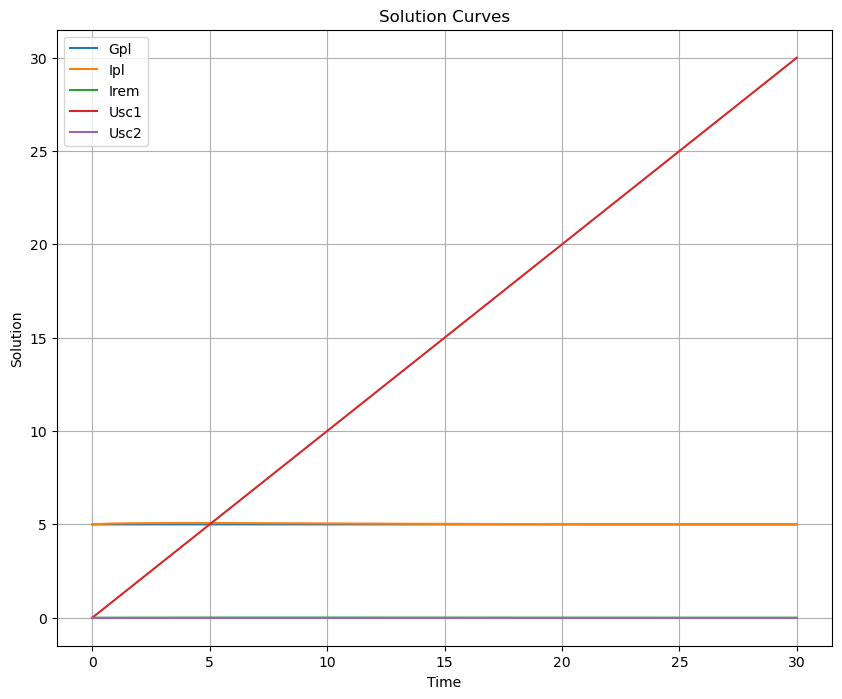

In [1]:
import numpy as np
from scipy.integrate import solve_ivp
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from scipy.integrate import quad
from mpl_toolkits.mplot3d import Axes3D

variables = {
    'k1': 0.094,
    'k2': 0.0094,
    'k3': 0.12,
    'k4': 2.35e-4,
    'k5': 9.49e-2,
    'k6': 1.93e-1,
    'k7': 1.15,
    'k8': 7.27,
    'k9': 0,
    'k10': 0,
    'k11': 3.83e-2,
    'k12': 2.84e-1,
    'k13': 0,
    'sigma': 1.8,
    'K_M': 13.2,
    'Gbpl': 5,
    'Ibpl': 5,
    'gbliv': 0.043,
    'Gthpl': 9,
    'vG': 17 / 70,
    'vI': 13 / 70,
    'beta': 1,
    'f': 0.005551,
    'tau_i': 31,
    't_start': 0,
    't_end': 30,
    't_start_ipnc': 0,
    't_end_ipnc': 15,
    'tau_d': 3,
    'c1': 0.1,
    'h': 1,
    't_half': 1,
    'a': 1,
    'b': 1
}

inputs = {
    'Dmeal': 136,
    'Mb': 66,
    'usa': lambda t: 1,
    'Ula': lambda t: 1,
    'h': 2
}

def MGgut(t):
    D_meal = inputs['Dmeal']
    k1 = variables['k1']
    sigma = variables['sigma']
    return D_meal * np.exp(-(k1 * t)**sigma)

def dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def gliv(Gpl, Irem):
        gbliv = variables['gbliv']
        k3 = variables['k3']
        Gbpl = variables['Gbpl']
        k4 = variables['k4']
        beta = variables['beta'] 
        return gbliv - k3 * (Gpl - Gbpl) - k4 * beta * Irem

    def ggut(MGgut):
        k2 = variables['k2']
        f = variables['f']
        vG = variables['vG']
        Mb = inputs['Mb']
        return k2 * (f / (vG * Mb)) * MGgut

    def gnonit(Gpl):
        gbliv = variables['gbliv']
        KM = variables['K_M']
        Gbpl = variables['Gbpl']
        return gbliv * ((KM + Gbpl) / Gbpl) * (Gpl / (KM + Gpl))

    def git(Gpl, Irem):
        k5 = variables['k5']
        beta = variables['beta']
        KM = variables['K_M']
        return k5 * beta * Irem * (Gpl / (KM + Gpl))

    def gren(Gpl):
        c1 = variables['c1']
        vG = variables['vG']
        Mb = inputs['Mb']
        Gthpl = variables['Gthpl']
        return 0 if Gpl < Gthpl else (c1 / (vG * Mb)) * (Gpl - Gthpl)

    return gliv(Gpl, Irem) + ggut(MGgut(t)) - gnonit(Gpl) - git(Gpl, Irem) - gren(Gpl)

def dUsc1_dt(t, Usc1):
    k10 = variables['k10']
    usa = inputs['usa']
    return usa(t) - k10 * Usc1

def dUsc2_dt(t, Usc1, Usc2):
    k9 = variables['k9']
    k10 = variables['k10']
    return k10 * Usc1 - k9 * Usc2

def dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def ipnc(t, Gpl, dGpl_dt):
        Gbpl = variables['Gbpl']
        beta = variables['beta']
        k6 = variables['k6']
        k7 = variables['k7']
        tau_i = variables['tau_i']
        k8 = variables['k8']
        tau_d = variables['tau_d']
        t_start = variables['t_start']
        t_end = variables['t_end']
        start = variables['t_start_ipnc']
        end = variables['t_end_ipnc']

        def integrand(x):
            return Gpl - Gbpl

        integral_term, _ = quad(integrand, start, end)
        return (1 / beta) * (k6 * (Gpl - Gbpl) + (k7 / tau_i) * integral_term + (k7 / tau_i) * Gbpl + (k8 * tau_d) * dGpl_dt)

    def isa(t, Usc2):
        k9 = variables['k9']
        vI = variables['vI']
        Mb = inputs['Mb']
        return k9 * (1 / (vI * Mb)) * Usc2

    def ila(t, Ula):
        h = variables['h']
        t_half = variables['t_half']
        vI = variables['vI']
        Mb = inputs['Mb']
        return ((h * (t_half ** h) * (t ** (h - 1))) / (((t_half ** h) + (t ** h)) ** 2)) * ((1 / (vI * Mb)) * Ula(t))

    def iliv(t, Gpl, Ipl):
        k7 = variables['k7']
        beta = variables['beta']
        tau_i = variables['tau_i']
        Ibpl = variables['Ibpl']
        return k7 * (variables['Gbpl'] / (beta * tau_i * Ibpl)) * Ipl

    def irem(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    return ipnc(t, Gpl, dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)) + isa(t, Usc2) + ila(t, inputs['Ula']) - iliv(t, Gpl, Ipl) - irem(t, Ipl)

def dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2):
    def ipl(t, Ipl):
        k11 = variables['k11']
        Ibpl = variables['Ibpl']
        return k11 * (Ipl - Ibpl)

    def iit(t, Irem):
        k12 = variables['k12']
        return k12 * Irem

    return ipl(t, Ipl) - iit(t, Irem)

# Define the time span
t_span = (0, 30)

# Define the initial conditions
Gpl0 = 5.0
Ipl0 = 5.0
Irem0 = 0.0
Usc1_0 = 0.0
Usc2_0 = 0.0

# Combine the functions into a single function
def system(t, variables):
    Gpl, Ipl, Irem, Usc1, Usc2 = variables
    dGpl = dGpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIpl = dIpl_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dIrem = dIrem_dt(t, Gpl, Ipl, Irem, Usc1, Usc2)
    dUsc1 = dUsc1_dt(t, Usc1)
    dUsc2 = dUsc2_dt(t, Usc1, Usc2)
    return [dGpl, dIpl, dIrem, dUsc1, dUsc2]

# Solve the system of differential equations
solution = solve_ivp(system, t_span, [Gpl0, Ipl0, Irem0, Usc1_0, Usc2_0], method='LSODA')

# Extract the results
t = solution.t
Gpl = solution.y[0]
Ipl = solution.y[1]
Irem = solution.y[2]
Usc1 = solution.y[3]
Usc2 = solution.y[4]

# Plot solution curves
plt.figure(figsize=(10, 8))
plt.plot(t, Gpl, label='Gpl')
plt.plot(t, Ipl, label='Ipl')
plt.plot(t, Irem, label='Irem')
plt.plot(t, Usc1, label='Usc1')
plt.plot(t, Usc2, label='Usc2')
plt.xlabel('Time')
plt.ylabel('Solution')
plt.title('Solution Curves')
plt.legend()
plt.grid(True)
plt.show()